## Predicting Airbnb Listing Prices with Listing Characteristics
### STAT 301 - Final Project
By: Joyce Cao, Matthew Tam, Zaim Naqvi, Genevieve Hoang

### Introduction

Short-term rental platforms such as Airbnb have transformed the hospitality industry by offering travelers a wide range of accommodation options beyond traditional hotels.  As the market continues to grow, accurately pricing lisitngs is becoming increasingly important for both hosts and poetential guests.  In this project, we aim to develop a predictive model to estimate the total price of an Airbnb listing based on various listing characteristics, including room type, number of guests, location features, and host attributes. By exploring these factors through exploratory data analysis and statistical modeling, we hope to understand which variables are most influential in determining price.

### Data Description

**Source:** https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities

There are 6 datasets in total, containing data about Airbnb listings in Barcelona, Paris, and Vienna, on the weekdays and weekends.

The data has been combined, and the columns `city` and `day_type` were created.

The combined dataset contains 13,058 rows of data about Airbnb listings in Barcelona, Paris, and Vienna.

The combined dataset contains 21 columns:

| Variable                  | Description                                                                                  | Type        |
|---------------------------|----------------------------------------------------------------------------------------------|-------------|
| realSum                   | The total price of the Airbnb listing (€).                                                       | Numeric     |
| room_type                 | The type of room being offered (Entire home/apt, Private room, or Shared room).              | Categorical |
| room_shared               | Whether the room is shared or not.                                                           | Boolean     |
| room_private              | Whether the room is private or not.                                                          | Boolean     |
| person_capacity           | The maximum number of guests                                                                 | Numeric     |
| host_is_superhost         | Whether the host is a superhost or not.                                                      | Boolean     |
| multi                     | Whether the listing is for multiple rooms or not.                                            | Boolean     |
| biz                       | Whether the listing is for business purposes or not.                                         | Boolean     |
| cleanliness_rating        | Cleanliness rating of the listing (0-10)                                                     | Numeric     |
| guest_satisfaction_overall| Overall guest satisfaction rating of the listing (0-100)                                     | Numeric     |
| bedrooms                  | The number of bedrooms in the listing.                                                       | Numeric     |
| dist                      | The distance from the city centre (km)                                                       | Numeric     |
| metro_dist                | The distance from the nearest metro station (km)                                             | Numeric     |
| attr_index                | Attraction index of the listing location (accessibility of attractions within city limits)   | Numeric     |
| attr_index_norm           | Normalised attraction index (0-100)                                                          | Numeric     |
| rest_index                | Restaurant index of the listing location (accessibility of restaurants within city limits)   | Numeric     |
| rest_index_norm           | Normalised restaurant index (0-100)                                                          | Numeric     |
| lng                       | The longitude of the listing.                                                                | Numeric     |
| lat                       | The latitude of the listing.                                                                 | Numeric     |
| city                      | The city of the listing                                                                      | Categorical |
| day_type                  | The day type of the listing                                                                  | Categorical |

**Question:**

Using this dataset, we would like to answer the question:
>Which set of predictors, methods, and coefficients best predict Airbnb listing prices in Paris, Barcelona, and Vienna based on various characteristics of the Airbnb

We are interested in understanding how the combination of different listing characteristics and location-related factors can predict Airbnb pricing of future listings. Specifically, we will explore the physical characteristics of each Airbnb (e.g. room type, how many people it accommodates, the cleanliness rating, etc.) and the external factors (e.g. distance from metro or city center, the city it is in, the day of the week, etc.)

Thus, we define `realSum` as the response variable, and consider all other variables that show a significant relationship with it as explanatory variables.

---

### Method and Results

In [1]:
# Load Packages
library(tidyverse)
library(broom)
library(leaps)
library(MASS)
library(rsample)
library(dplyr)
library(readr)
library(corrplot)
library(ggplot2)
library(car)
library(glmnet)

set.seed(999)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


corrplot 0.92 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4

In [2]:
# Load Data 
airbnb <- read_csv('airbnb.csv')
head(airbnb)

Rows: 13058 Columns: 21
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): room_type, city, day_type
dbl (15): realSum, person_capacity, multi, biz, cleanliness_rating, guest_sa...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**a.) Exploratory Data Analysis (EDA)**

In [3]:
# Main developer: Joyce 
#Check for na values in the data
sum(is.na(airbnb))

[1] 0

In [4]:
# Main developer: Joyce 
# Handle potential outliers in price (remove extreme values)
airbnb <- filter(airbnb, realSum > 0 & realSum < quantile(realSum, 0.99, na.rm = TRUE))
head(airbnb)

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**Correlation With Price:**

To explore the relationships between the continuous variables and price, we can plot a correlation heatmap. This helps us to quickly identify which numeric variables are associated with price, to what degree, and identify variables that might have less explanatory power. It also helps us spot potential multicollinearity issues.

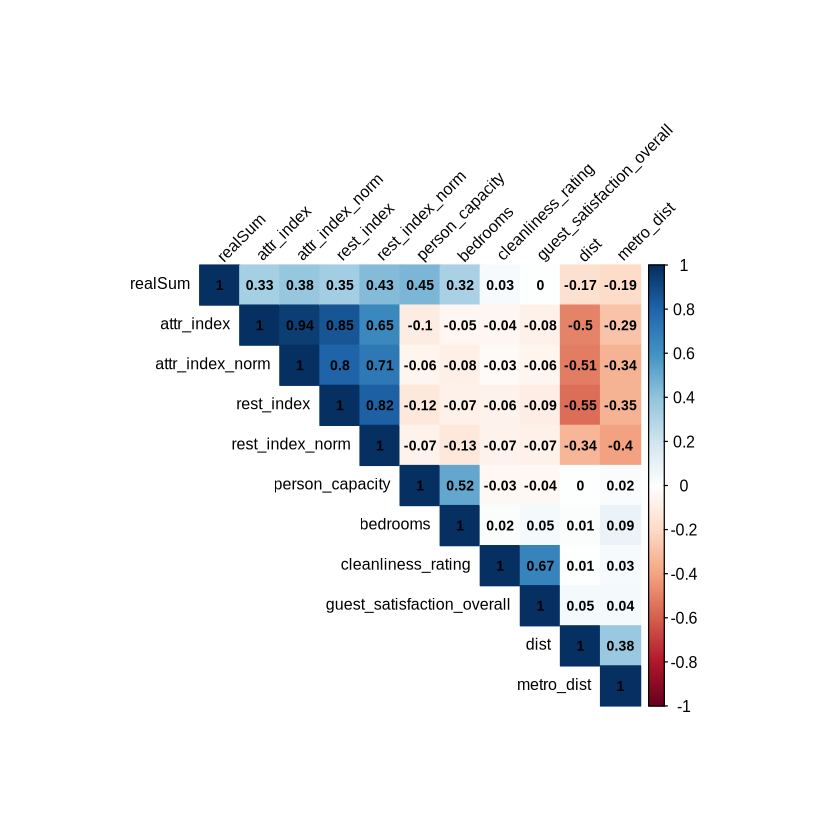

In [5]:
# Main developer: Joyce 
# Contributor: Matthew (Interpretation)

selected_cols <- c("realSum", "person_capacity", "bedrooms", "cleanliness_rating", 
                   "guest_satisfaction_overall", "dist", "metro_dist", "attr_index", "rest_index",
                   "attr_index_norm", "rest_index_norm")

correlation_data <- airbnb[, selected_cols]

cor_matrix <- cor(correlation_data)

corrplot(cor_matrix, 
         method = "color",   
         type = "upper",    
         order = "hclust",          
         tl.cex = 0.8,           
         tl.col = "black",    
         tl.srt = 45,              
         addCoef.col = "black",    
         number.cex = 0.7)

From the plot, we can note that `person_capacity`, `rest_index_norm`, and `attr_index_norm` show the highest absolute correlations with `realSum`, at $0.45$, $0.43$, and $0.38$ respectively. Note the strong associations between `attr_index` and `attr_index_norm`, and between `rest_index` and `rest_index_norm`. This is expected, as the latter variables are normalized versions of the former.  Finally, note that the variable `dist` shows a moderate negative association with the attraction and rest index variables.

Next, we will explore the relationships between the response and the categorical variables.  We can use boxplots to show visual comparison of the distributions of the response at each factor level, including the median, spread, and outliers.  This can help determine which categorical variables are likely to be significant predictors and reveal patterns of factor-level differences in price.


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




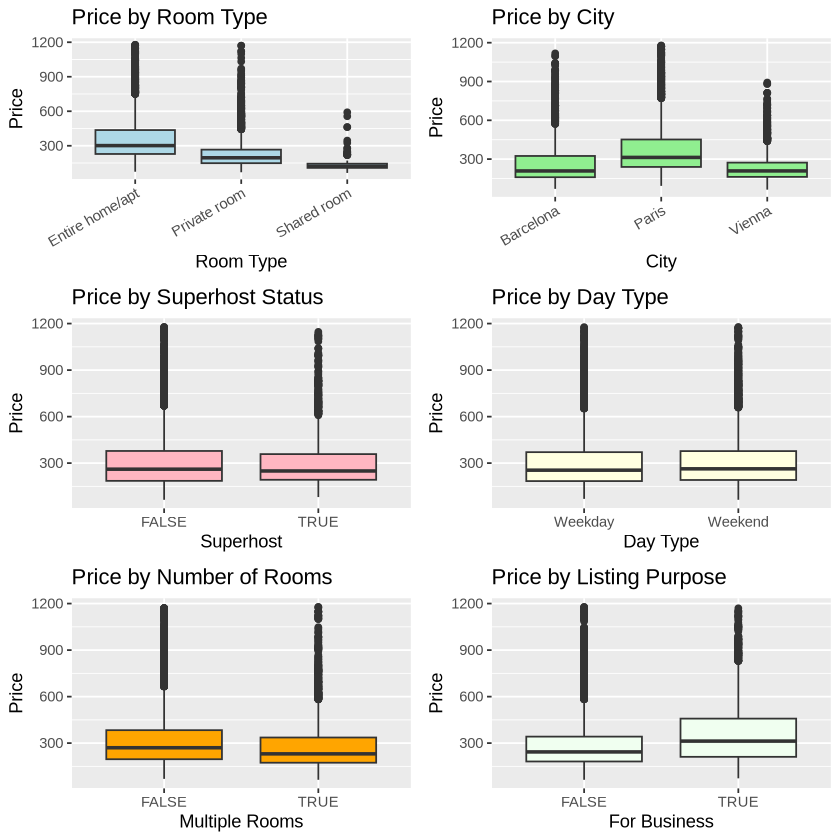

In [6]:
# Main developer: Joyce 
# Contributor: Matthew (Interpretation, Debugging)

# Price vs Room Type
p1 <- ggplot(airbnb, aes(x = room_type, y = realSum)) +
    geom_boxplot(fill = "lightblue") +
    labs(title = "Price by Room Type", x = "Room Type", y = "Price") +
    theme(axis.text.x = element_text(angle = 30, hjust = 1))

# Price vs City
p2 <- ggplot(airbnb, aes(x = city, y = realSum)) +
    geom_boxplot(fill = "lightgreen") +
    labs(title = "Price by City", x = "City", y = "Price") +
    theme(axis.text.x = element_text(angle = 30, hjust = 1))

# Price vs Superhost
p3 <- ggplot(airbnb, aes(x = factor(host_is_superhost), y = realSum)) +
    geom_boxplot(fill = "lightpink") +
    labs(title = "Price by Superhost Status", x = "Superhost", y = "Price") 

# Price vs Day Type
p4 <- ggplot(airbnb, aes(x = day_type, y = realSum)) +
    geom_boxplot(fill = "lightyellow") +
    labs(title = "Price by Day Type", x = "Day Type", y = "Price")

# Price vs Number of Rooms
p5 <- ggplot(airbnb, aes(x = factor(multi), y = realSum)) +
    geom_boxplot(fill = "orange") +
    labs(title = "Price by Number of Rooms", x = "Multiple Rooms", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE"))

# Price vs Purpose 
p6 <- ggplot(airbnb, aes(x = factor(biz), y = realSum)) +
    geom_boxplot(fill = "honeydew") +
    labs(title = "Price by Listing Purpose", x = "For Business", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE"))


library(gridExtra)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)

From these boxplots, we observe that `room_type` and `city` show differences in price between their factor levels.  For `room_type`, we can see that entire home/apartment listings have the highest median price, followed by private, then shared rooms.  For `city`, we can see that Paris has the highest median price, followed by Vienna, then Barcelona.  We can also see that business listings (`biz`) tend to have higher prices, and listings for multiple rooms (`multi`) tend to have slightly lower prices.  These patterns suggest that these variables could potentially be significant predictors of price.

The remaining variables do not show notable patterns, suggesting that they may not have a significant impact on price.  We should also consider that their effects could be confounded by other variables.

We removed the following variables from our dataset based on domain knowledge and statistical justification:
- `room_shared` and `room_private`: Information is already captured by the room_type variable, which is more comprehensive.
- `attr_index` and `rest_index`: Redundant, contribute to multicollinearity with their normalized versions (attr_index_norm, rest_index_norm), which we retained.
- `lng` and `lat`: Location information is already summarized by the city variable.

In [7]:
# Main developer: Matthew
# Select Relevant Variables
airbnb_clean <- airbnb %>%
    dplyr::select(
        -room_shared,
        -room_private,
        -attr_index,
        -rest_index,
        -lng,
        -lat
    )
head(airbnb_clean)

realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,city,day_type
<dbl>,<chr>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,4,FALSE,0,1,10,91,1,1.111996,0.63049095,17.94293,20.15489,Barcelona,Weekday
169.8978,Private room,2,TRUE,1,0,10,88,1,1.751839,0.12401717,10.91046,17.48449,Barcelona,Weekday
161.9848,Private room,4,FALSE,0,1,9,88,1,1.670493,0.08032198,11.72659,18.50581,Barcelona,Weekday
367.9568,Entire home/apt,3,FALSE,0,1,10,91,1,1.475847,0.09310686,13.63460,20.83736,Barcelona,Weekday
196.8953,Private room,3,FALSE,1,0,9,91,1,1.855452,0.27248605,11.79368,17.44087,Barcelona,Weekday
330.9517,Entire home/apt,3,FALSE,0,1,9,100,2,2.565611,0.70129045,13.32889,11.56818,Barcelona,Weekday


**b.) Analysis Plan**

To answer our question, we will perform the following steps:
1. **Data Splitting**: We will begin by splitting the splitting the dataset into a training set (75%) and a testing set (25%) using `initial_split()` from the rsample package. All variable selection and model fitting will be conducted exclusively on the training set to avoid data leakage and ensure an unbiased estimate of the model's performance
2. **Variable Selection**: To identify the most relevant predictors of Airbnb listing prices, we will apply LASSO regression via `cv.glmnet` which applies an L1-norm penalty to shrink less important coefficients to zero. This approach is more robust than traditional stepwise selection, and helps prevent overfitting. The optimal value of the regularization parameter $\lambda$ was chosen using cross-validation, ensuring that the chosen model generalizes well to new data by minimizing prediction error on unseen subsets of training data.
3. **Model Evaluation**: Once the final model is selected, we will evaluate its predictive performance using the testing set. Since our response variable `realSum` is continuous, we will use the RMSE to measure the average magnitude of the prediction errors and the R-squared metric to quantify the proportion of variance in listing prices that is explinated by the model on unseen data. We will use the `predict()` function to generate prediction on the test data.
4. **Model Diagnostic Checks**: Before finalizing the model, we will perform a series of diagnostic checks to ensure key assumptions of linear regression are not violated, including:
   - Assessing linearity and homoscedasticity using residual plots
   - Evalute normality of residuals using QQ-plots
   - Check multicolinearity among predictors using `vif()`

**c.) Results**

**Data Splitting**

In [8]:
# Main developer: Matthew
# Train/Test Split
split_data <- initial_split(airbnb_clean, prop = 0.75)

train <- training(split_data)
test <- testing(split_data)

**Variable Selection**

In [9]:
# Main developer: Joyce

# Lasso Regression
lasso_model <- cv.glmnet(model.matrix(realSum ~ . - 1, data = train),
                         y = train$realSum,
                         alpha = 1
    
)
lasso_model


Call:  cv.glmnet(x = model.matrix(realSum ~ . - 1, data = train), y = train$realSum,      alpha = 1) 

Measure: Mean-Squared Error 

    Lambda Index Measure    SE Nonzero
min  0.209    65   15303 438.0      16
1se  5.962    29   15696 474.3      11

In [10]:
# Main developer: Joyce

# Chosen Lasso Coefficients
beta_lasso <- coef(lasso_model, s = "lambda.min")


lasso_selected_covariates <- as_tibble(
        as.matrix(beta_lasso),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & abs(s1) !=0) %>% 
        pull(covariate)

cat(paste0("- ", lasso_selected_covariates), sep = "\n")

- room_typeEntire home/apt
- room_typeShared room
- person_capacity
- host_is_superhostTRUE
- multi
- biz
- cleanliness_rating
- guest_satisfaction_overall
- bedrooms
- dist
- metro_dist
- attr_index_norm
- rest_index_norm
- cityParis
- cityVienna
- day_typeWeekend


In [11]:
# Main developer: Joyce

# To keep the reference levels of dummy variables consistent through lasso and lm
train$room_type <- relevel(factor(train$room_type), ref = "Private room")

# Selected linear model
airbnb_mlr_predictor <- lm(realSum ~ ., data = train)

tidy(airbnb_mlr_predictor)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-223.3467499,16.4268881,-13.5964127,1.015078e-41
room_typeEntire home/apt,79.9161031,3.4695311,23.0336895,2.452909e-114
room_typeShared room,-152.2948173,13.3903368,-11.3734867,8.756841e-30
person_capacity,41.8367785,1.4047762,29.7818109,1.470004e-186
host_is_superhostTRUE,12.1717250,3.3776281,3.6036309,3.153778e-04
multi,19.9455658,3.2092606,6.2150034,5.343992e-10
biz,62.0525202,3.2371119,19.1690997,2.051274e-80
cleanliness_rating,10.8457334,1.7869872,6.0692844,1.333031e-09
guest_satisfaction_overall,0.5868656,0.2068340,2.8373745,4.558079e-03


**Model Evaluation**

In [12]:
# Main Developer: Joyce

evaluate_model <- function(observed, predicted) {
  residuals <- observed - predicted
  
  metrics <- list(
    RMSE = sqrt(mean(residuals^2)),
    MAE = mean(abs(residuals)),
    R_squared = 1 - sum(residuals^2) / sum((observed - mean(observed))^2)
  )
  
  return(metrics)
}

# Compute RMSE
test_predictions <- predict(airbnb_mlr_predictor, newdata = test)

model_performance <- evaluate_model(test$realSum, test_predictions)

model_performance

$RMSE
[1] 119.5124

$MAE
[1] 85.77273

$R_squared
[1] 0.5419883

The model achieved a test RMSE of approximately 119.51, a test MAE of 85.77, and a test R-squared of 0.542. 

- The test RMSE of 119.51 indicates that, on average, the model's predicted listing prices differ from the actual prices by about 122 euros, with larger errors being penalized more heavily due to the squaring of residuals.
- The MAE of 85.77 provides a more straighforward measure, indicating that, on average, the model's predictions are off by about 88 euros. We believe this is within a reasonable range given the variability in Airbnb prices.
- The R-squared value of 0.542 indicates that about 54.2% of the variation in Airbnb listing prices in the test set is explained by our model, suggesting that a meaningful portion of the data is captured by the model, though there is still room for improvement.

Overall, our model shows moderate predictive accuracy, and could be potentially further improved (discussed further in the dicussion)

**Model Diagnostic Check**

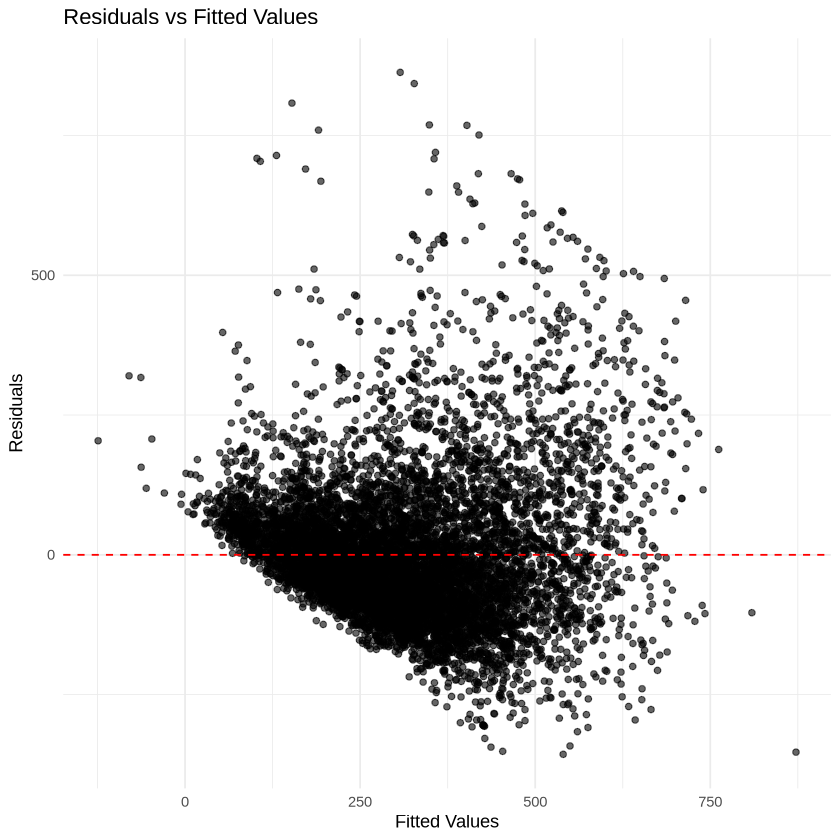

In [13]:
# Main Developer: Joyce

# Residuals vs Fitted Values
diagnostics <- augment(airbnb_mlr_predictor)

ggplot(diagnostics, aes(.fitted, .resid)) +
  geom_point(alpha = 0.6) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal()

The residuals vs fitted values plot shows that the residuals are generally centered around zero, however, there is a clear funnel-shaped pattern (spread of residuals increase with fitted values). This indicates a violation of the constant variance (homoscedasticity) assumption. Thus, this model tends to be more variable and less accurate for higher-priced listings. This could potentially be addressed in future work by transforming the response variable (e.g. log transformation).

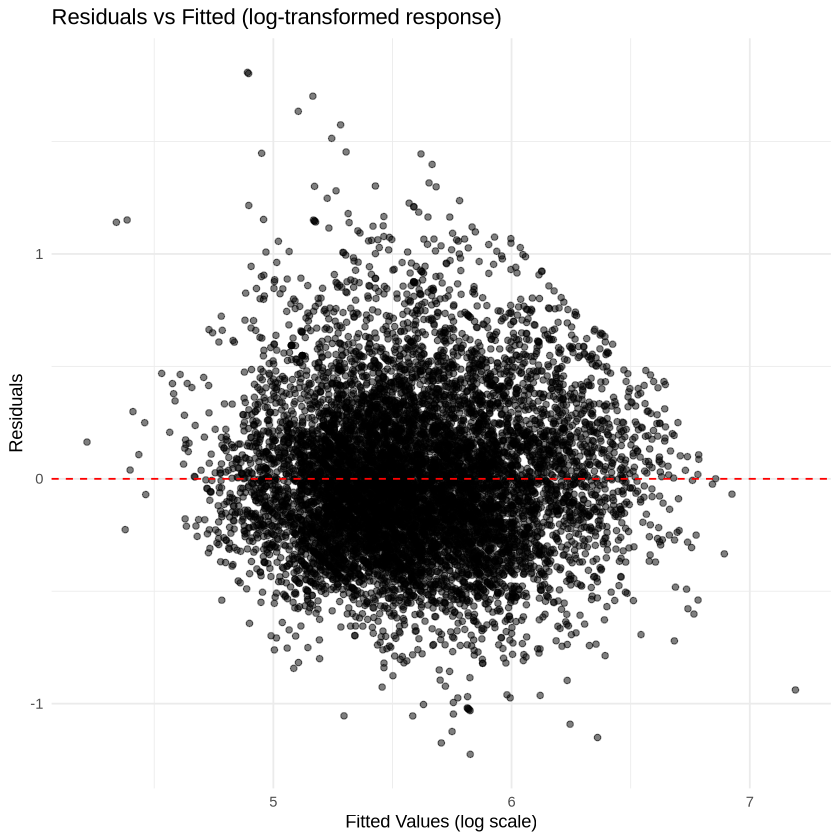

In [14]:
# Main developer: Joyce
airbnb_log_model <- lm(
  log(realSum) ~ 
    room_type + 
    person_capacity + 
    cleanliness_rating + 
    bedrooms + 
    dist +
    metro_dist + 
    attr_index_norm + 
    rest_index_norm + 
    city + 
    day_type, 
  data = train
)

diagnostics_log <- augment(airbnb_log_model)

# Plot Residuals vs Fitted
library(ggplot2)
ggplot(diagnostics_log, aes(.fitted, .resid)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Residuals vs Fitted (log-transformed response)",
       x = "Fitted Values (log scale)",
       y = "Residuals") +
  theme_minimal()

The log transformation of the response variable improved the model assumptions and addressed the heteroscedasticity issue. However, transforming the response changes the interpretation of the model and can introduce bias when exponentiating the predictions to the original scale. To maintain interpretability and direct prediction of the response, we will choose to continue with the original model for prediction. Future studies focusing on improving model validity could address this violation through transformations or other modeling techniques.

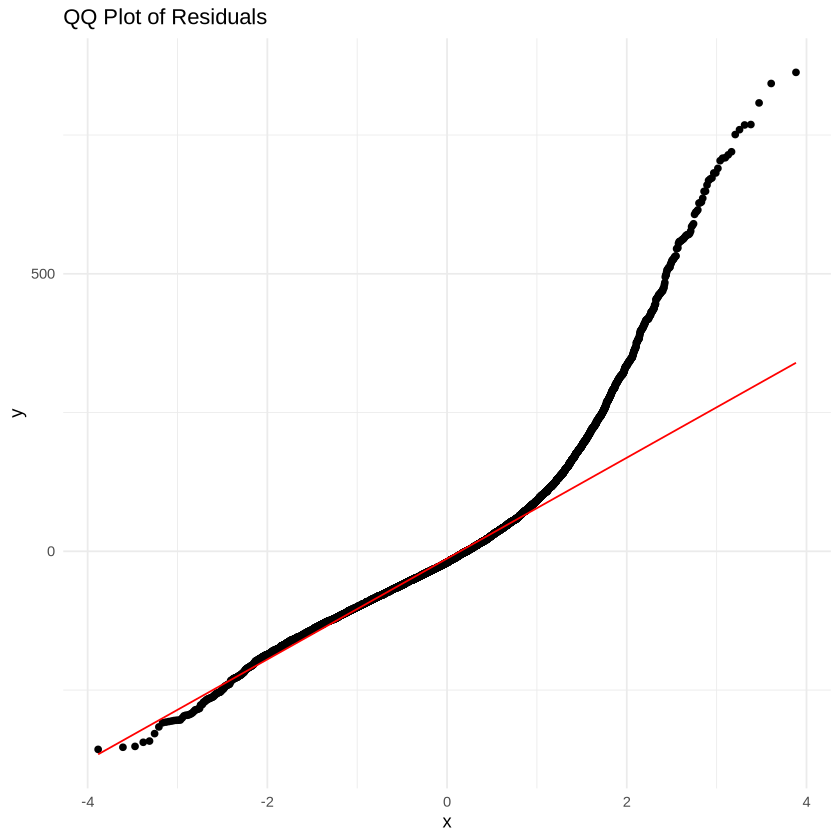

In [15]:
# Main Developer: Joyce
# QQ plot
ggplot(diagnostics, aes(sample = .resid)) +
  stat_qq() +
  stat_qq_line(color = "red") +
  labs(title = "QQ Plot of Residuals") +
  theme_minimal()

There seems to be some right skewness in the residuals, however, since our sample size is large, we can proceed with the current model while acknowledging that prediction intervals may be less accurate due to the heavy tails. The point estimates and overall model performance should remain reliable.

In [16]:
# Main Developer: Joyce
vif(airbnb_mlr_predictor)

,GVIF,Df,GVIF^(1/(2*Df))
room_type,1.763759,2,1.152417
person_capacity,1.912414,1,1.382901
host_is_superhost,1.104457,1,1.050931
multi,1.288862,1,1.135280
biz,1.376573,1,1.173275
cleanliness_rating,1.851427,1,1.360672
guest_satisfaction_overall,1.933239,1,1.390410
bedrooms,1.532202,1,1.237821
dist,2.218126,1,1.489338
metro_dist,1.522551,1,1.233917


Most predictors had low VIF values (below 5), indicating minimal multicollinearity. Two predictors — `rest_index_norm` and `city` — had moderately high VIFs (both around 8), suggesting some multicollinearity. However, since the goal of this analysis is prediction rather than inference, and the predictive performance was not negatively affected, all variables were retained in the final model.

---

### Discussion

> this is the discussion

---

### Conclusion

> this is the conclusion

---

### References

1. Reference 1
2. Reference 2